# Twitter Real-Time Sentiment Prediction

## <font style="color:rgb(76,10,168)">Overall architecture:</font>

<img src="flowchart.jpg" alt="drawing" align="middle" width="600" height="400"/>

### Import packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from bokeh.plotting import figure
from bokeh.io import output_notebook, show
from bokeh.models import LinearColorMapper
from bokeh.models import HoverTool
import re 
from time import time
import warnings
from bs4 import BeautifulSoup
from scipy.stats import hmean, norm
from nltk.tokenize import WordPunctTokenizer
from wordcloud import WordCloud
from tqdm import tqdm
import multiprocessing
import gensim
from gensim.models.word2vec import Word2Vec
from gensim.models.doc2vec import TaggedDocument
from gensim.models import KeyedVectors
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn import utils
from sklearn.preprocessing import scale
from sklearn.externals import joblib
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers.embeddings import Embedding
from keras.layers import Input, concatenate, Activation
from keras.layers import Conv1D, GlobalMaxPooling1D, LSTM
from keras.models import Model, load_model
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.models import load_model
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

plt.style.use("seaborn-darkgrid")
warnings.filterwarnings("ignore")

Using TensorFlow backend.


## <font style="color:rgb(76,10,168)">Dataset: sentiment-labeled tweets</font>


Three sources: 

* ”Sentiment140” by Stanford University
* ”UMICH SI650-Sentiment Classification” by Univ. of Michigan
* ”Twitter Sentiment Corpus” by Niek Sanders

### Read data sets

In [3]:
df1_col_names = ['sentiment','id','date','query_string','user','text']
df3_col_names = ['sentiment', 'text']
df1 = pd.read_csv("data/sentiment140_training.csv", header=None, names=df1_col_names)
df2 = pd.read_csv("data/nieksanders_full.csv", header="infer")
df3 = pd.read_csv("data/umich_training.txt", header=None, sep="\t", names=df3_col_names)

### Drop useless columns

In [4]:
df1.drop(['id','date','query_string','user'], axis=1, inplace=True)
df2.drop(['Topic','TweetId','TweetDate'], axis=1, inplace=True)
df2.columns = ['sentiment', 'text']

### Map sentiment value to 0 or 1

In [5]:
df1['sentiment'].unique()

array([0, 4])

In [6]:
df1['sentiment'] = df1['sentiment'].apply(lambda x: 1 if x==4 else x)
df2 = df2.loc[(df2['sentiment'] == 'positive') | (df2['sentiment'] == 'negative')]
df2['sentiment'] = df2['sentiment'].apply(lambda x: 1 if x=="positive" else 0)

### Concat three data sets

In [7]:
df = pd.concat([df1, df2, df3])
df.reset_index(inplace=True)

## <font style="color:rgb(76,10,168)">Data preprocessing</font>

Steps: 

1. HTML escaping 
2. URL removal, user name removal
3. BOM removal 
4. Emojis removal 
5. Negaiton handling
6. Lowercase 
7. Tokenization and Join

In [8]:
html_pattern = r"https?://[^ ]+"
www_pattern = r"www.[^ ]+"
user_pattern = r"@[A-Za-z0-9_]+"
url_user_pattern = r"|".join((html_pattern, www_pattern, user_pattern))
emojis_pattern = re.compile(
                  u"(\ud83d[\ude00-\ude4f])|"  # emoticons
                  u"(\ud83c[\udf00-\uffff])|"  # symbols & pictographs (1 of 2)
                  u"(\ud83d[\u0000-\uddff])|"  # symbols & pictographs (2 of 2)
                  u"(\ud83d[\ude80-\udeff])|"  # transport & map symbols
                  u"(\ud83c[\udde0-\uddff])"   # flags
                  "+", flags=re.UNICODE)
negations = {"isn't":"is not", "aren't":"are not", "wasn't":"was not", "weren't":"were not",
             "don't":"do not", "doesn't":"does not", "didn't":"did not",
             "haven't":"have not", "hasn't":"has not", "hadn't":"had not",
             "won't":"will not", "wouldn't":"would not",
             "can't":"can not", "couldn't":"could not",
             "shouldn't":"should not",
             "mightn't":"might not",
             "mustn't":"must not"}
negations_pattern = re.compile(r'\b(' + '|'.join(negations.keys()) + r')\b')
tokenizer = WordPunctTokenizer()

def clean_tweet(tweet):
    #html encoding
    soup = BeautifulSoup(tweet, "lxml")         
    souped = soup.get_text()
    #url and user name removal
    url_clean = re.sub(url_user_pattern, "", souped)  
    #emojis removal
    emojis_clean = emojis_pattern.sub("", url_clean) 
    #BOM removal
    try:
        bom_clean = emojis_clean.decode("utf-8-sig").replace(u"\ufffd", "?")  
    except:
        bom_clean = emojis_clean
    #negation handling
    negation_clean = negations_pattern.sub(lambda x: negations[x.group()], bom_clean)
    #remove single letters
    letters_only = re.sub("[^a-zA-Z]", " ", negation_clean)
    #lowercase
    lower = letters_only.lower()
    #tokenization 
    words = [x for x in tokenizer.tokenize(lower) if len(x) > 1]
    #join
    tweet_clean = (" ".join(words)).strip()
    return tweet_clean

### Clean tweets and save results

In [19]:
%%time
tweets_cleaned = []
for i in xrange(0, len(df)):
    if ((i+1) % 100000) == 0:
        print "Tweets %d of %d has been processed" % ( i+1, len(df) )
    tweets_cleaned.append(clean_tweet(df.text[i]))

df_cleaned = pd.DataFrame(tweets_cleaned, columns=["text"])
df_cleaned["target"] = df.sentiment
df_cleaned.to_csv("tweets_cleaned.csv", encoding="utf-8")

Tweets 100000 of 1608009 has been processed
Tweets 200000 of 1608009 has been processed
Tweets 300000 of 1608009 has been processed
Tweets 400000 of 1608009 has been processed
Tweets 500000 of 1608009 has been processed
Tweets 600000 of 1608009 has been processed
Tweets 700000 of 1608009 has been processed
Tweets 800000 of 1608009 has been processed
Tweets 900000 of 1608009 has been processed
Tweets 1000000 of 1608009 has been processed
Tweets 1100000 of 1608009 has been processed
Tweets 1200000 of 1608009 has been processed
Tweets 1300000 of 1608009 has been processed
Tweets 1400000 of 1608009 has been processed
Tweets 1500000 of 1608009 has been processed
Tweets 1600000 of 1608009 has been processed
CPU times: user 12min 24s, sys: 11.7 s, total: 12min 35s
Wall time: 12min 35s


### Read cleaned tweets and drop NaN rows

In [28]:
df_clean = pd.read_csv("tweets_cleaned.csv", index_col=0)
df_clean.dropna(inplace=True)
df_clean.reset_index(drop=True, inplace=True)

In [24]:
df_clean["target"].value_counts()

1    802296
0    801726
Name: target, dtype: int64

## <font style="color:rgb(76,10,168)">Exploratory Data Analysis (EDA)</font>

### Plot WordCloud for positive and negative tweets

In [25]:
df_positive = df_clean[df_clean["target"]==1]  
df_negative = df_clean[df_clean["target"]==0]
np_positive = df_positive.text.values
np_negative = df_negative.text.values
text_positive = pd.Series(np_positive).str.cat(sep=" ")
text_negative = pd.Series(np_negative).str.cat(sep=" ")
wc_positive = WordCloud(width=1800, height=1000, max_font_size=250).generate(text_positive)
wc_negative = WordCloud(width=1800, height=1000, max_font_size=250).generate(text_negative)

(-0.5, 1799.5, 999.5, -0.5)

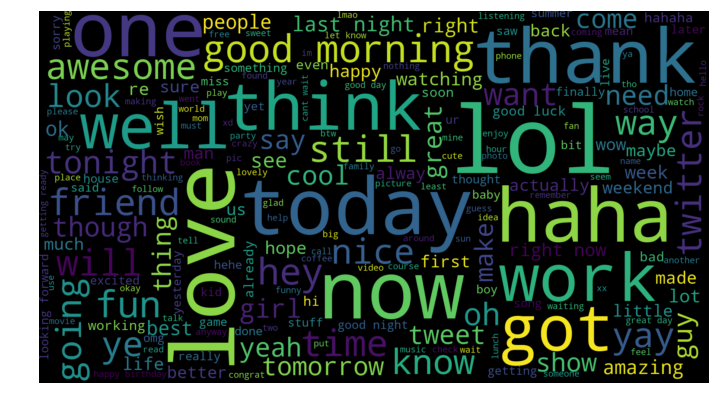

In [26]:
plt.figure(figsize=(12,10))
plt.imshow(wc_positive, interpolation="bilinear")
plt.axis("off")

(-0.5, 1799.5, 999.5, -0.5)

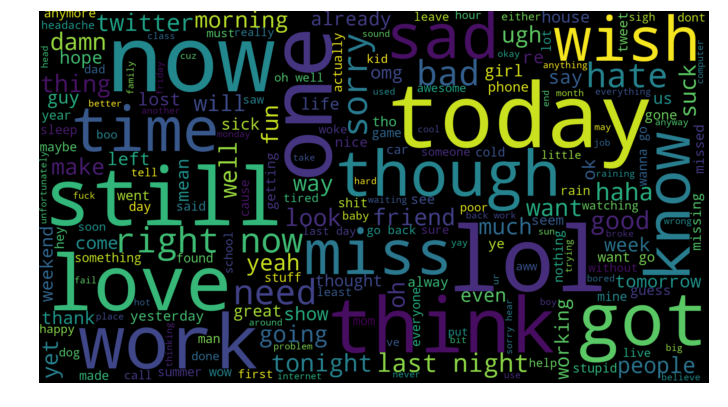

In [27]:
plt.figure(figsize=(12,10))
plt.imshow(wc_negative, interpolation="bilinear")
plt.axis("off")

### Explore positive and negative words

In [29]:
count_vectorizer = CountVectorizer()
count_vectorizer.fit(df_clean.text)
mat_positive = count_vectorizer.transform(df_clean[df_clean.target==1].text)
mat_negative = count_vectorizer.transform(df_clean[df_clean.target==0].text)
tf_positive  = np.sum(mat_positive, axis=0)
tf_negative  = np.sum(mat_negative, axis=0)
np_positive  = np.squeeze(np.asarray(tf_positive))
np_negative  = np.squeeze(np.asarray(tf_negative))
df_tf = pd.DataFrame([np_negative,np_positive], columns=count_vectorizer.get_feature_names()).transpose()
df_tf.columns = ["negative", "positive"]
df_tf["total"] = df_tf.negative + df_tf.positive

$\textbf{positive_rate} = \frac{positive\space frequency}{positive\space frequency \space + \space negative\space frequency}$

$\textbf{positive_relative_frequency} = \frac{positive\space frequency}{\sum_i{positive \space frequency}}$

$\textbf{harmonic mean} = \frac{n}{\sum_{i=1}^{n}{\frac{1}{x_i}}}$

**CDF (Cumulative Distribution Function)**:  distribution function of X, evaluated at x, CDF is the probability that X will take a value less than or equal to x

In [30]:
def normcdf(x):
    return norm.cdf(x, x.mean(), x.std())

df_tf["positive_rate"] = df_tf["positive"]*1. / df_tf["total"]
df_tf['positive_relative_frequency'] = df_tf['positive'] * 1./df_tf['positive'].sum()
df_tf["positive_rate_normcdf"]     = normcdf(df_tf["positive_rate"])
df_tf["positive_relative_frequency_normcdf"] = normcdf(df_tf["positive_relative_frequency"])
df_tf["positive_normcdf_harmonic_mean"]    = hmean([df_tf["positive_rate_normcdf"], df_tf["positive_relative_frequency_normcdf"]])
df_tf["negative_rate"]             = df_tf["negative"] * 1. / df_tf["total"]
df_tf["negative_relative_frequency"]         = df_tf["negative"] * 1. / df_tf["negative"].sum()
df_tf["negative_rate_normcdf"]     = normcdf(df_tf["negative_rate"])
df_tf["negative_relative_frequency_normcdf"] = normcdf(df_tf["negative_relative_frequency"])
df_tf["negative_normcdf_harmonic_mean"]    = hmean([df_tf["negative_rate_normcdf"], df_tf["negative_relative_frequency_normcdf"]])

In [19]:
df_tf.drop(['positive_rate', 'negative_rate', 'positive_relative_frequency', 'negative_relative_frequency', 'positive_rate_normcdf', 'negative_rate_normcdf', 'positive_relative_frequency_normcdf', 'negative_relative_frequency_normcdf'], axis=1, inplace=True)
df_tf.to_csv("term_frequencies.csv", encoding="utf-8")

### Plot top 20 positive and negative tokens

In [2]:
df_tf = pd.read_csv("term_frequencies.csv", index_col=0)

In [10]:
y_coords = np.arange(20)
df_tf_positive_sorted = df_tf.sort_values(by="positive_normcdf_harmonic_mean", ascending=False)["positive_normcdf_harmonic_mean"][:20]
df_tf_negative_sorted = df_tf.sort_values(by="negative_normcdf_harmonic_mean", ascending=False)["negative_normcdf_harmonic_mean"][:20]

Text(0,0.5,'Words')

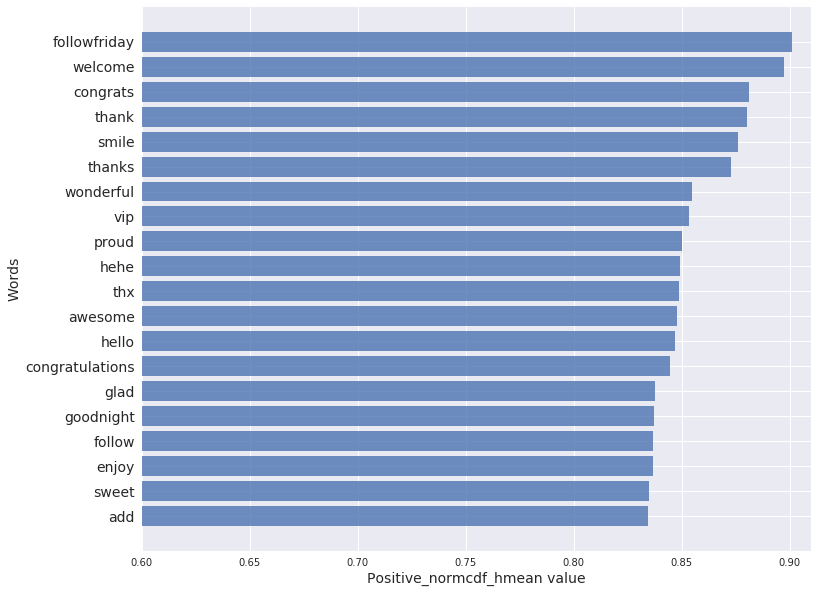

In [33]:
plt.figure(figsize=(12,10))
plt.barh(-y_coords, df_tf_positive_sorted, align="center", alpha=0.8)
plt.yticks(-y_coords, df_tf_positive_sorted.index, rotation="horizontal", fontsize=14)
plt.xlabel("Positive_normcdf_hmean value", fontsize=14)
plt.xlim((0.60, 0.91))
plt.ylabel("Words", fontsize=14)

Text(0,0.5,'Words')

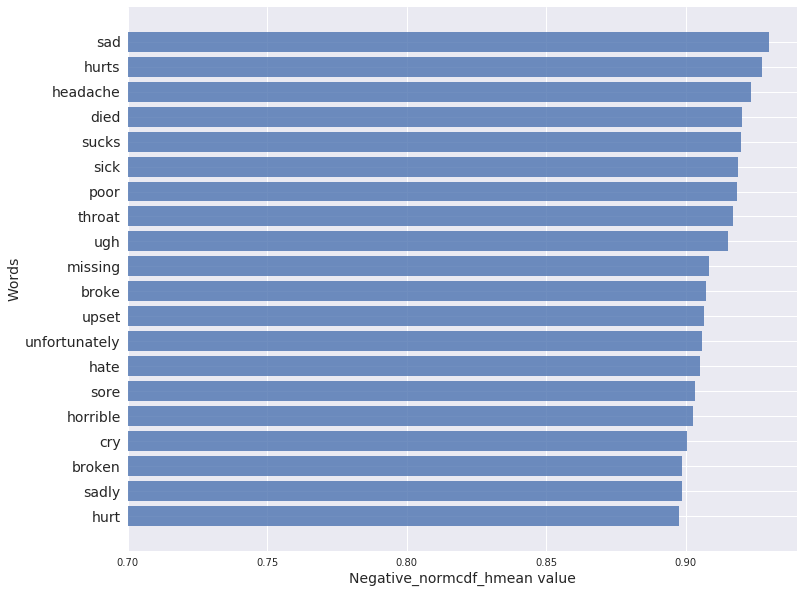

In [34]:
plt.figure(figsize=(12,10))
plt.barh(-y_coords, df_tf_negative_sorted, align="center", alpha=0.8)
plt.yticks(-y_coords, df_tf_negative_sorted.index, rotation="horizontal", fontsize=14)
plt.xlabel("Negative_normcdf_hmean value", fontsize=14)
plt.xlim((0.70, 0.94))
plt.ylabel("Words", fontsize=14)

### Plot positive_normcdf_harmonic_mean vs negative_normcdf_harmonic_mean

In [3]:
output_notebook()
color_mapper = LinearColorMapper(palette='Inferno256', 
                                 low=min(df_tf.positive_normcdf_harmonic_mean), 
                                 high=max(df_tf.positive_normcdf_harmonic_mean))
p = figure(x_axis_label='negative_normcdf_harmonic_mean', 
           y_axis_label='positive_normcdf_harmonic_mean')
p.circle('negative_normcdf_harmonic_mean',
         'positive_normcdf_harmonic_mean',
         size=5,
         alpha=0.3,
         source=df_tf, 
         color={'field': 'positive_normcdf_harmonic_mean', 'transform': color_mapper})
hover = HoverTool(tooltips=[('token','@index')])
p.add_tools(hover)
show(p)

Loading BokehJS ...

## <font style="color:rgb(76,10,168)">Feature Extraction: Word Embedings</font>

**Word2Vec Skip-Gram model**:

<img src="skip_gram.jpg" alt="drawing" align="middle" width="500" height="200"/>

In [17]:
tqdm.pandas(desc="progress-bar")
cpus = multiprocessing.cpu_count()

In [18]:
df_clean = pd.read_csv("tweets_cleaned.csv", index_col=0)
df_clean.dropna(inplace=True)
df_clean.reset_index(drop=True, inplace=True)
X = df_clean.text
y = df_clean.target
X_train, X_vali_test, y_train, y_vali_test = train_test_split(X, y, test_size=0.02, random_state=8081)
X_vali, X_test, y_vali, y_test = train_test_split(X_vali_test, y_vali_test, test_size=0.5, random_state=8081)

In [22]:
def tag_documents(tweets, prefix):
    '''
      Labelize each tweet with an unique ID. 
    '''
    tagged_tweets = []
    for i, t in zip(tweets.index, tweets):
        tagged_tweets.append(TaggedDocument(t.split(), [prefix + str(i)]))
    return tagged_tweets
X_tagged = tag_documents(X, 'tweet_')

def tweet_word2vec(tweet, size, model, aggr):
    '''
      Generate sentence vector for each tweet based on word vectors.
    '''
    tweet_vecs = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tweet.split():
        try:
            tweet_vecs += model[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if aggr == 'mean':
        if count != 0:
            tweet_vecs /= count
        return tweet_vecs
    elif aggr == 'sum':
        return tweet_vecs

### Word2Vec Skip-Gram model

In [9]:
word2vec_skgr = Word2Vec(sg=1, size=100, negative=5, window=2, min_count=2, workers=cpus, alpha=0.05)
word2vec_skgr.build_vocab([x.words for x in tqdm(X_tagged)])

100%|██████████| 1604022/1604022 [00:00<00:00, 2603728.52it/s]


In [10]:
%%time
word2vec_skgr.train([x.words for x in tqdm(X_tagged)], 
                    total_examples=len(X_tagged), 
                    epochs=30)

100%|██████████| 1604022/1604022 [00:00<00:00, 2839017.44it/s]


CPU times: user 38min 23s, sys: 56.1 s, total: 39min 19s
Wall time: 6min 55s


In [ ]:
X_train_w2vs_skgr_mean = scale(np.concatenate([tweet_word2vec(tweet, 100, word2vec_skgr,'mean') for tweet in X_train]))
X_vali_w2vs_skgr_mean  = scale(np.concatenate([tweet_word2vec(tweet, 100, word2vec_skgr,'mean') for tweet in X_vali]))
X_train_vali_w2vs_skgr_mean = (X_train_w2vs_skgr_mean, X_vali_w2vs_skgr_mean)

### Save Word2Vec model and tweet vectors

In [11]:
word2vec_skgr.save("word2vec_skgr.w2v")
joblib.dump(X_train_vali_w2vs_skgr_mean, 'X_train_vali_w2vs_skgr_mean.pkl') 

## <font style="color:rgb(76,10,168)">Deep Learning Models</font>

### Prepare training examples for deep learning models

In [6]:
#vectorize the sentences
tokenizer = Tokenizer(num_words=100000) 
tokenizer.fit_on_texts(X_train)
sequences_train = tokenizer.texts_to_sequences(X_train)
sequences_vali  = tokenizer.texts_to_sequences(X_vali)
#pad the sentences to have same length
X_train_sequences = pad_sequences(sequences_train, maxlen=50)
X_vali_sequences  = pad_sequences(sequences_vali, maxlen=50)

In [7]:
vocab_w2v_matrix = np.zeros((100000, 100))
for word, i in tokenizer.word_index.items():
    vocab_w2v_vector = word2vec_skgr.wv[word]
    if vocab_w2v_vector is not None:
        vocab_w2v_matrix[i] = vocab_w2v_vector

['vocab_w2v_matrix.pkl']

In [18]:
joblib.dump(vocab_w2v_matrix, 'vocab_w2v_matrix.pkl') 
joblib.dump(X_train_sequences, 'X_train_sequences.pkl') 
joblib.dump(X_vali_sequences, 'X_vali_sequences.pkl') 

['X_vali_sequences.pkl']

In [36]:
vocab_w2v_matrix = joblib.load("vocab_w2v_matrix.pkl")
X_train_sequences = joblib.load("X_train_sequences.pkl")
X_vali_sequences = joblib.load("X_vali_sequences.pkl")

### Load cleaned tweets

In [34]:
df_clean = pd.read_csv("tweets_cleaned.csv", index_col=0)
df_clean.dropna(inplace=True)
df_clean.reset_index(drop=True, inplace=True)
X = df_clean.text
y = df_clean.target
X_train, X_vali_test, y_train, y_vali_test = train_test_split(X, y, test_size=0.02, random_state=8081)
X_vali, X_test, y_vali, y_test = train_test_split(X_vali_test, y_vali_test, test_size=0.5, random_state=8081)

### LSTM model

<img src="lstm.jpg" alt="drawing" align="middle" width="600" height="400"/>

In [38]:
lstm_model = Sequential()
lstm_model.add(Embedding(100000, 100, weights=[vocab_w2v_matrix], input_length=50, trainable=True))
lstm_model.add(Dropout(0.5))
lstm_model.add(LSTM(128))
lstm_model.add(Dense(64))
lstm_model.add(Dropout(0.5))
lstm_model.add(Activation("relu"))
lstm_model.add(Dense(1))
lstm_model.add(Activation("sigmoid"))
adam       = Adam(lr=0.005, beta_1=0.9, beta_2=0.999, epsilon=1e-8)
lstm_model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
lstm_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 50, 100)           10000000  
_________________________________________________________________
dropout_1 (Dropout)          (None, 50, 100)           0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 128)               117248    
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
_________________________________________________________________
activation_1 (Activation)    (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 65        
__________

### Train the LSTM model

In [ ]:
best_lstm_model_file = "best_LSTM_model.{epoch:02d}-{val_acc:.5f}.hdf5"
checkpoint = ModelCheckpoint(best_lstm_model_file, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
early_stop = EarlyStopping(monitor="val_acc", patience=5, mode="max")
reduce_lr  = ReduceLROnPlateau(monitor="val_acc", factor=0.5, patience=2, min_lr=0.000001)
lstm_model.fit(X_train_sequences, y_train, batch_size=128, epochs=30, shuffle=True, callbacks=[checkpoint, early_stop, reduce_lr])

### CNN model

<img src="cnn.jpg" alt="drawing" align="middle" width="600" height="400"/>

<center>Image courtesy of Zhang et al. (2015) “A Sensitivity Analysis of Convolutional Neural Networks for Sentence Classification”</center>

In [39]:
input      = Input(shape=(50,), dtype='int32')
embedding  = Embedding(100000, 100, weights=[vocab_w2v_matrix], input_length=50, trainable=True)(input)
conv1      = Conv1D(filters=100, kernel_size=2, padding='valid', activation='relu', strides=1)(embedding)
conv1_pool = GlobalMaxPooling1D()(conv1)
conv2      = Conv1D(filters=100, kernel_size=3, padding='valid', activation='relu', strides=1)(embedding)
conv2_pool = GlobalMaxPooling1D()(conv2)
conv3      = Conv1D(filters=100, kernel_size=4, padding='valid', activation='relu', strides=1)(embedding)
conv3_pool = GlobalMaxPooling1D()(conv3)
conv123_concat = concatenate([conv1_pool, conv2_pool, conv3_pool], axis=1)
full       = Dense(256, activation='relu')(conv123_concat)
dropout    = Dropout(0.2)(full)
output     = Dense(1)(dropout)
output     = Activation('sigmoid')(output)
cnn_model      = Model(inputs=[input], outputs=[output])
adam       = Adam(lr=0.005, beta_1=0.9, beta_2=0.999, epsilon=1e-8)
cnn_model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
cnn_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 50)           0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 50, 100)      10000000    input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 49, 100)      20100       embedding_3[0][0]                
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 48, 100)      30100       embedding_3[0][0]                
__________________________________________________________________________________________________
conv1d_3 (

### Train the CNN model

In [ ]:
best_cnn_model_file = "best_CNN_model.{epoch:02d}-{val_acc:.5f}.hdf5"
checkpoint = ModelCheckpoint(best_cnn_model_file, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
early_stop = EarlyStopping(monitor="val_acc", patience=5, mode="max")
reduce_lr  = ReduceLROnPlateau(monitor="val_acc", factor=0.5, patience=2, min_lr=0.000001)
cnn_model.fit(X_train_sequences, y_train, batch_size=128, epochs=5, validation_data=(X_vali_sequences, y_vali), callbacks = [checkpoint, early_stop, reduce_lr])

### Other machine learning baseline models

In [2]:
X_train_vali_w2vs_skgr_mean = joblib.load("X_train_vali_w2vs_skgr_mean.pkl")
X_train_w2vs_skgr_mean, X_vali_w2vs_skgr_mean = X_train_vali_w2vs_skgr_mean

In [45]:
def grid_search_summary(grid_result):
    '''
    Print grid search summary results
    '''
    print "Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_)
    means = grid_result.cv_results_['mean_test_score']
    stds = grid_result.cv_results_['std_test_score']
    params = grid_result.cv_results_['params']
    for mean, stdev, param in zip(means, stds, params):
        print "%f (%f) with: %r" % (mean, stdev, param)

In [ ]:
#Grid search for Linear Regression 
C = [0.001, 0.01, 0.1, 1, 10, 100]
penalty = ["l1", "l2"]
solver  = ["liblinear", "lbfgs", "newton-cg"]
param_grid = dict(C=C, penalty=penalty, solver=solver)
logistic     = LogisticRegression()
grid_lr = GridSearchCV(estimator=logistic, param_grid=param_grid, cv=10, n_jobs=-1)
grid_result_lr = grid_lr.fit(X_train_sequences, y_train)
grid_search_summary(grid_result_lr)

In [ ]:
#Grid search for Linear SVM 
C = [0.001, 0.01, 0.1, 1, 10, 100]
penalty = ["l1", "l2"]
param_grid = dict(C=C, penalty=penalty)
linear_svm     = LinearSVC()
grid_svm = GridSearchCV(estimator=linear_svm, param_grid=param_grid, cv=10, n_jobs=-1)
grid_result_svm = grid_svm.fit(X_train_sequences, y_train)
grid_search_summary(grid_result_svm)

In [ ]:
#Grid search for Random Forest
n_estimators = [10, 50, 100, 200, 400, 800]
max_depth = [None, 10, 20, 40, 80]
min_samples_leaf = [1, 2, 4]
max_features = ['sqrt', 'log2']
param_grid = dict(n_estimators=n_estimators, max_depth=max_depth, min_samples_leaf=min_samples_leaf, max_features=max_features)
rf = RandomForestClassifier()
grid_rf = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1)
grid_result_rf = grid_rf.fit(X_train_sequences, y_train)
grid_search_summary(grid_result_rf)

In [ ]:
#Grid search for Gridient Boosting
learning_rate = [0.01, 0.05, 0.1, 0.25, 0.5, 1]
n_estimators  = [10, 50, 100, 200, 400, 800]
min_samples_leaf = [1, 2, 4]
max_features = ['sqrt', 'log2']
param_grid = dict(learning_rate=learning_rate, n_estimators=n_estimators, min_samples_leaf=min_samples_leaf, max_features=max_features)
gb = GradientBoostingClassifier()
grid_gb = GridSearchCV(estimator=gb, param_grid=param_grid, cv=10, n_jobs=-1)
grid_result_gb = grid_gb.fit(X_train_sequences, y_train)
grid_search_summary(grid_result_gb)

## <font style="color:rgb(76,10,168)">Evaluation Results</font>

|Model|Accuracy on validation set|Accuracy on testing set|Training time|
|:-----:|:--------------------------:|:-----------------------:|:-------------:|
| Logistic Regression | 79.68% | 80.43% | 3 min 39 s | 
| Linear SVM | 78.25% | 79.84% | 16 min 22 s | 
| Random Forest | 71.91% | 70.77% | 7 min 30 s| 
| Gradient Boosting | 73.32% | 71.25% | 26 min 26 s|
| LSTM | 82.15% | 82.79% | 22 h 38 min | 
| CNN  | 82.60% | 83.32% | 27 h 49 min |  

### Grid search hyperparamters for deep learning models

* Tune batch size and training epochs 
* Tune learning rate, decay rate, and momentum 
* Tune dropout rate
* Tune weight initialization method
* Tune optimization method
* Tune number of neurons in hidden layer

In [41]:
# Tune batch size and training epochs for LSTM model
def create_model():
    lstm_model = Sequential()
    lstm_model.add(Embedding(100000, 100, weights=[vocab_w2v_matrix], input_length=50, trainable=True))
    lstm_model.add(Dropout(0.5))
    lstm_model.add(LSTM(128))
    lstm_model.add(Dense(64))
    lstm_model.add(Dropout(0.5))
    lstm_model.add(Activation("relu"))
    lstm_model.add(Dense(1))
    lstm_model.add(Activation("sigmoid"))
    adam       = Adam(lr=0.005, beta_1=0.9, beta_2=0.999, epsilon=1e-8)
    lstm_model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return lstm_model

model = KerasClassifier(build_fn=create_model, verbose=0) 
# define the grid search parameters
batch_size = [5, 10, 15, 20, 30, 40]
epochs = [64, 128, 256]
param_grid = dict(batch_size=batch_size, epochs=epochs)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1)
grid_result = grid.fit(X_train_sequences, y_train)
# summarize results
grid_search_summary(grid_result)